In [18]:
# v2
# data load and prepration
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

path = "../data/processed/"

# data load
# building = pd.read_csv(path + "building_240405_1230.csv")
building = pd.read_csv(path + "20240414_Survival_Features_Labeled.csv")
# review = pd.read_csv(path + "restaurant_review.csv")
review = pd.read_csv(path + "restaurant_review_240405.csv")

df = building.merge(review, on="bin", how="left")

X = df[
    [
        "rating",
        "user_ratings_total",
        "lat",
        "lng",
        # "flag_restaurant_one_year",
        "food_100",
        "food_400",
        "food_800",
        "food_1000",
        "bus_100",
        "bus_400",
        "bus_1000",
        "train_100",
        "train_400",
        "train_1000",
        "office_area",
        "retail_area",
        "residential_area",
        "street_width_min",
        "street_width_max",
        # "betweeness",
        "dist_station",
        "dist_park",
        "dist_school",
        "office_450",
        "retail_450",
        "residential_450",
        "ridership_morning_mean",
        "ridership_midday_mean",
        "ridership_evening_mean",
        "ridership_night_mean",
        "ridership_late_night_mean",
        "idw_aadt_mean",
        "idw_atvc_mean",
    ]
].dropna()

# Standardize the combined dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13120 entries, 0 to 13119
Data columns (total 48 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   flag_restaurant_one_year   13120 non-null  int64  
 1   bin                        13120 non-null  int64  
 2   camis                      13120 non-null  int64  
 3   latitude                   13120 non-null  float64
 4   longitude                  13120 non-null  float64
 5   open_year                  13120 non-null  int64  
 6   close_year                 13120 non-null  int64  
 7   years_open                 13120 non-null  int64  
 8   food_100                   13120 non-null  int64  
 9   food_400                   13120 non-null  int64  
 10  food_800                   13120 non-null  int64  
 11  food_1000                  13120 non-null  int64  
 12  bus_100                    13120 non-null  int64  
 13  bus_400                    13120 non-null  int

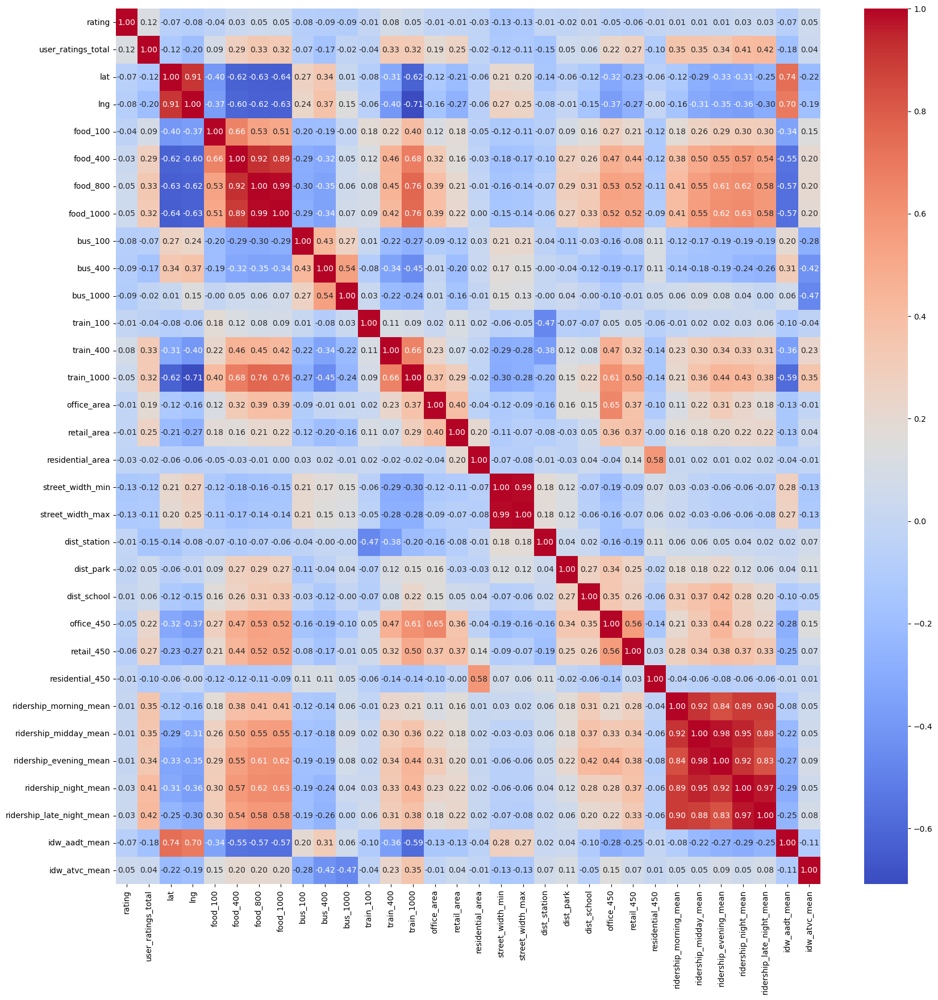

In [4]:
import seaborn as sns

# correlation matrix
corr = X.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(
    corr,
    annot=True,
    cmap="coolwarm",
    # cmap="viridis",
    fmt=".2f",
    xticklabels=corr.columns.values,
    yticklabels=corr.columns.values,
)

plt.show()

Explained variance ratio: [2.97969376e-01 1.05263950e-01 6.54490002e-02 6.26964332e-02
 5.71026687e-02 5.27240789e-02 4.49973312e-02 3.74681561e-02
 3.36089809e-02 2.93532532e-02 2.80206485e-02 2.33958732e-02
 2.23814861e-02 1.96059671e-02 1.74307531e-02 1.60560179e-02
 1.40260306e-02 1.26581130e-02 1.10464958e-02 1.05496754e-02
 9.52003526e-03 7.35993566e-03 5.99714558e-03 5.21242512e-03
 3.81241346e-03 2.28005071e-03 1.81365796e-03 1.36299371e-03
 3.56969993e-04 2.15839407e-04 1.68342223e-04 9.59014330e-05]
Cumulative explained variance ratio: [0.29796938 0.40323333 0.46868233 0.53137876 0.58848143 0.64120551
 0.68620284 0.72367099 0.75727998 0.78663323 0.81465388 0.83804975
 0.86043124 0.8800372  0.89746796 0.91352397 0.92755001 0.94020812
 0.95125461 0.96180429 0.97132432 0.97868426 0.98468141 0.98989383
 0.99370624 0.9959863  0.99779995 0.99916295 0.99951992 0.99973576
 0.9999041  1.        ]


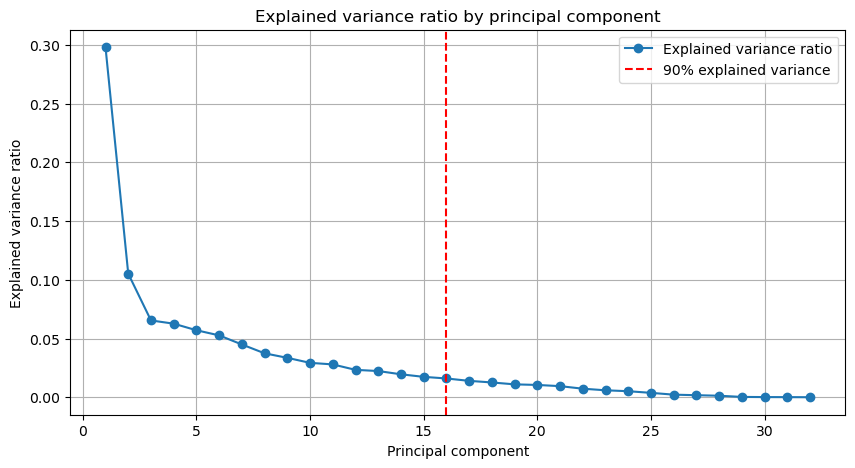

In [6]:
# run kmeans clustering
from sklearn.decomposition import PCA


# PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance_ratio)

# Cumulative explained variance ratio
cumulative_explained_variance_ratio = explained_variance_ratio.cumsum()
print("Cumulative explained variance ratio:", cumulative_explained_variance_ratio)

# Plot the explained variance ratio
plt.figure(figsize=(10, 5))
plt.plot(
    range(1, len(explained_variance_ratio) + 1),
    explained_variance_ratio,
    marker="o",
    label="Explained variance ratio",
)
# vertical line for cumulative explained variance ratio > 0.95
plt.axvline(
    x=(cumulative_explained_variance_ratio > 0.90).argmax() + 1,
    color="red",
    linestyle="--",
    label="90% explained variance",
)
plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.title("Explained variance ratio by principal component")
# grid
plt.grid()
plt.legend()
plt.show()

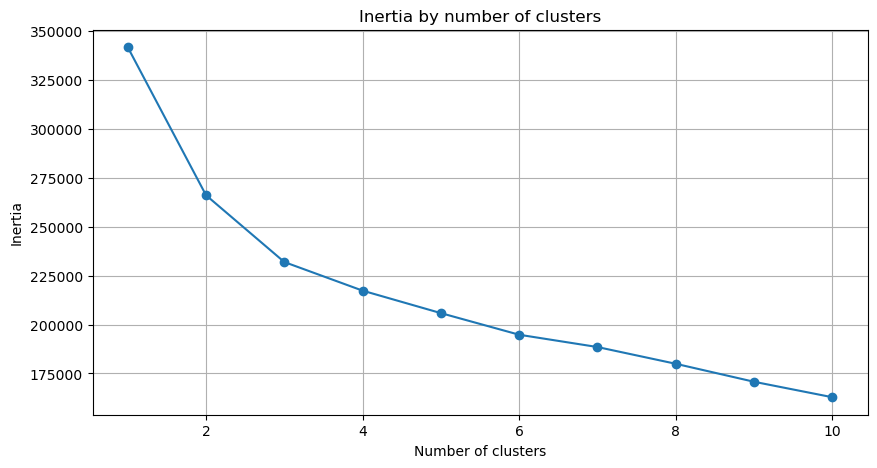

In [7]:
from sklearn.cluster import KMeans

# KMeans clustering
# Elbow method to determine the optimal number of clusters
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), inertia, marker="o")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Inertia by number of clusters")
plt.grid()

In [17]:
import pickle


def kmCluster(data, pca_components=4, n_clusters=3):

    # Perform PCA for dimensionality reduction
    pca = PCA(n_components=pca_components)
    X_pca = pca.fit_transform(data)

    # Perform K-means clustering
    model = KMeans(n_clusters=n_clusters, init="k-means++")
    clusters = model.fit_predict(X_pca)

    return model, clusters


# Perform K-means clustering
model, clusters = kmCluster(X_scaled, pca_components=15, n_clusters=4)
# save model as pickle
pickle.dump(model, open("../models/kmeans.pkl", "wb"))
X["cluster"] = clusters
X["cluster"] = X["cluster"].astype("int")

In [9]:
X.groupby("cluster")[["rating", "user_ratings_total"]].mean()

,rating,user_ratings_total
cluster,,
0,4.215789,1528.316729
1,4.218301,547.821480
2,4.297661,976.654570
3,4.296285,5062.851393


In [10]:
X.groupby("cluster")[
    [
        "office_area",
        "retail_area",
        "residential_area",
        "street_width_min",
        "street_width_max",
    ]
].mean()

,office_area,retail_area,residential_area,street_width_min,street_width_max
cluster,,,,,
0,777545.963346,40939.187030,62511.343985,35.557331,37.549812
1,7634.101652,6100.719109,54761.406430,41.189835,42.152299
2,45471.517742,21026.450269,44955.907527,32.695699,33.976613
3,251910.284830,58133.470588,81256.108359,36.278638,37.102167


In [11]:
X.groupby("cluster")[
    [
        "food_100",
        "food_400",
        "food_800",
        "food_1000",
        "bus_100",
        "bus_400",
        "bus_1000",
        "train_100",
        "train_400",
        "train_1000",
    ]
].mean()

,food_100,food_400,food_800,food_1000,bus_100,bus_400,bus_1000,train_100,train_400,train_1000
cluster,,,,,,,,,,
0,27.925752,317.220865,1153.290414,1699.668233,0.551692,7.628759,42.705827,0.196429,3.279135,16.497180
1,10.313039,84.086027,247.040230,339.917924,0.989943,9.509159,39.865481,0.139727,1.321839,5.447917
2,24.949731,241.338172,778.029839,1125.031452,0.307796,4.843011,32.605108,0.303763,2.860753,14.200538
3,24.919505,356.767802,1292.185759,1872.260062,0.123839,3.139319,35.077399,0.151703,4.473684,17.117647


In [12]:
X.groupby("cluster")[["office_450", "retail_450", "residential_450"]].mean()

,office_450,retail_450,residential_450
cluster,,,
0,7.034350e+06,874865.727444,7.141896e+05
1,1.419752e+05,145139.566451,2.284959e+06
2,1.738239e+06,303203.347849,1.653431e+06
3,2.671698e+06,791015.417957,1.463332e+06


In [13]:
X.groupby("cluster")[["dist_station", "dist_park", "dist_school"]].mean()

,dist_station,dist_park,dist_school
cluster,,,
0,611.843070,855.535711,1530.000811
1,765.448127,411.987632,613.935272
2,708.929847,414.460579,704.221352
3,748.708359,509.307748,892.329541


In [14]:
"""
0: highest office area, srrounded by second to the most restaurants, second highest number of google reviews on restaurants
1: a lot of office area and highest retail area among clusters, surrounded by most restaurants, highest number of google reviews on restaurants
2: highest residential area among clusters, 
3: largely residential area, with wide street width, lowest number of google reviews on restaurants, 

"""

'\n0: highest office area, srrounded by second to the most restaurants, second highest number of google reviews on restaurants\n1: a lot of office area and highest retail area among clusters, surrounded by most restaurants, highest number of google reviews on restaurants\n2: highest residential area among clusters, \n3: largely residential area, with wide street width, lowest number of google reviews on restaurants, \n\n'

In [39]:
X.groupby("cluster")[
    ["bus_100", "bus_400", "bus_1000", "train_100", "train_400", "train_1000"]
].mean()

,bus_100,bus_400,bus_1000,train_100,train_400,train_1000
cluster,,,,,,
0,0.333070,4.904160,32.981043,0.294892,2.944708,14.616640
1,0.380500,6.448663,40.841242,0.203624,3.565142,16.316652
2,0.994030,9.944776,41.254925,0.108060,1.346866,5.562687
3,0.949324,8.732686,37.681588,0.189189,1.312500,5.566723


In [24]:
X.columns

Index(['rating', 'user_ratings_total', 'lat', 'lng', 'food_100', 'food_400',
       'food_800', 'food_1000', 'bus_100', 'bus_400', 'bus_1000', 'train_100',
       'train_400', 'train_1000', 'office_area', 'retail_area',
       'residential_area', 'street_width_min', 'street_width_max',
       'dist_station', 'dist_park', 'dist_school', 'office_450', 'retail_450',
       'residential_450', 'ridership_morning_mean', 'ridership_midday_mean',
       'ridership_evening_mean', 'ridership_night_mean',
       'ridership_late_night_mean', 'idw_aadt_mean', 'idw_atvc_mean',
       'cluster'],
      dtype='object')

In [42]:
X.groupby("cluster")[
    [
        "ridership_morning_mean",
        "ridership_midday_mean",
        "ridership_evening_mean",
        "ridership_night_mean",
    ]
].mean()

,ridership_morning_mean,ridership_midday_mean,ridership_evening_mean,ridership_night_mean
cluster,,,,
0,249.926937,612.514346,750.009715,338.159479
1,1507.182129,2210.661890,2768.942676,1317.839170
2,273.210735,449.200966,433.368239,151.415163
3,274.381325,411.737662,388.109022,138.407696


In [10]:
# plt.hist(X[X["cluster"] == 0]["ridership_evening"].astype(float), bins=20)
# plt.hist(X[X["cluster"] == 1]["ridership_evening"].astype(float), bins=20)
# plt.hist(X[X["cluster"] == 2]["ridership_evening"].astype(float), bins=20)

In [41]:
X.groupby("cluster")[["idw_aadt_mean", "idw_atvc_mean"]].mean()

,idw_aadt_mean,idw_atvc_mean
cluster,,
0,9072.811577,194.917646
1,10861.642668,191.392199
2,14223.320444,183.516610
3,15274.161423,189.206847


In [34]:
# lat, lng mean by cluster
X.groupby("cluster")[["lat", "lng"]].mean()

,lat,lng
cluster,,
0,40.731155,-73.994017
1,40.753737,-73.984662
2,40.798216,-73.956923
3,40.808183,-73.948447


In [50]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
import folium

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X.sample(frac=0.5))):
    folium.Marker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        popup=X.iloc[i]["cluster"],
        icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
    ).add_to(map)

# Add flag_restaurant_one_year
# for i in range(len(X)):
#     folium.Marker(
#         location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
#         popup=X.iloc[i]["flag_restaurant_one_year"],
#         icon=folium.Icon(
#             color=colors[X.iloc[i]["flag_restaurant_one_year"].astype("int")]
#         ),
#     ).add_to(map)


# Display the map
map

In [49]:
# export the map as html
map.save("map.html")

In [83]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
# create as shade with legend
import folium
from folium import plugins

# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# Colors for the clusters
colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# Add markers to the map
for i in range(len(X.sample(frac=0.5))):
    folium.CircleMarker(
        location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
        radius=2,
        opacity=0.3,
        # popup=X.iloc[i]["cluster"],
        # popup for cluster and
        color=colors[X.iloc[i]["cluster"].astype("int")],
        fill=True,
        fill_color=colors[X.iloc[i]["cluster"].astype("int")],
    ).add_to(map)

# Display the map
map

In [68]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
# use HeatMap

import folium
from folium.plugins import HeatMap

target = X[X["cluster"] == 0]
# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[target["lat"].mean(), target["lng"].mean()], zoom_start=12)

# Create a HeatMap
heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# change the color to red
# HeatMap(heat_data, gradient={0.4: "blue", 0.65: "lime", 1: "red"}).add_to(map)
HeatMap(heat_data).add_to(map)

# Display the map
map

In [67]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
# use HeatMap

import folium
from folium.plugins import HeatMap

target = X[X["cluster"] == 1]
# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[target["lat"].mean(), target["lng"].mean()], zoom_start=12)

# Create a HeatMap
heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# HeatMap(heat_data, gradient={0.4: "blue", 0.65: "lime", 1: "red"}).add_to(map)
HeatMap(heat_data).add_to(map)

# Display the map
map

In [66]:
# viz without lat, lng
# visualize the clusters on the map using lat and lng via folium
# use HeatMap

import folium
from folium.plugins import HeatMap

target = X[X["cluster"] == 2]
# Create a map centered at the mean latitude and longitude
map = folium.Map(location=[target["lat"].mean(), target["lng"].mean()], zoom_start=12)

# Create a HeatMap
heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# heat_data = [[row["lat"], row["lng"]] for index, row in target.iterrows()]
# change the color to lime
# HeatMap(heat_data, gradient={0.4: "blue", 0.65: "red", 1: "lime"}).add_to(map)
HeatMap(heat_data).add_to(map)

# Display the map
map

In [60]:
# # viz without lat, lng
# # visualize the clusters on the map using lat and lng via folium
# # use markercluster

# import folium
# from folium.plugins import MarkerCluster

# # Create a map centered at the mean latitude and longitude
# map = folium.Map(location=[X["lat"].mean(), X["lng"].mean()], zoom_start=12)

# # Colors for the clusters
# colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred"]

# # Add markers to the map
# marker_cluster = MarkerCluster().add_to(map)
# for i in range(len(X.sample(frac=0.5))):
#     folium.Marker(
#         location=[X.iloc[i]["lat"], X.iloc[i]["lng"]],
#         popup=X.iloc[i]["cluster"],
#         icon=folium.Icon(color=colors[X.iloc[i]["cluster"].astype("int")]),
#     ).add_to(marker_cluster)

# # display
# map